# Predicting Speeding Tickets in Chattanooga - Tensorflow Models
___


<!-- 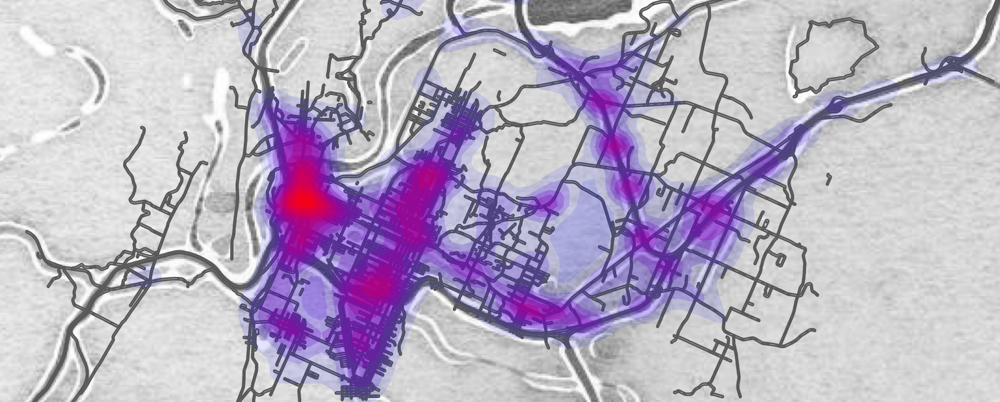 -->

<div>
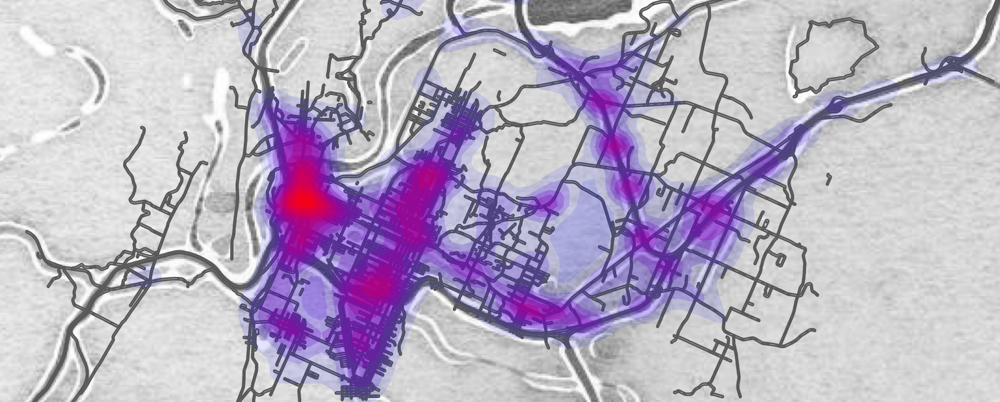
</div>

___
This tutorial explores the creation of a multi-layer perceptron neural network out of Tensorflow and Keras libraries, with additional result analysis provided by scikit-learn. Within this tutorial, the reader will begin to understand: 

* Import of datasets from CSV, and feather files. 
* Addition of temporal specification variables
* Addition of spatial markers to specific GPS coordinates
    * GPS coordinates to Spatial Points
    * Adjusting projection of Points. 
* Creation of negative samples based off of a collection of variable combinations.
* Creation of a variety of neural networks with combinations of input metrics. 
* Analysis of the performance of the aforementioned networks based on overall Accuracy and Recall. 
____

### Introduction to Tensorflow

For those who are not already familiar with the Tensorflow Python library, here is the definition of Tensorflow, from their website itself. 

>"TensorFlow is an end-to-end open source platform for machine learning. 
It has a comprehensive, flexible ecosystem of tools, libraries and community resources 
that lets researchers push the state-of-the-art in ML and developers easily build and deploy 
ML powered applications."
>-[Tensorflow.org](https://www.tensorflow.org/)

Tensorflow is an amazing backend for many common machine learning problems, and provides easy model building regardless of the coder's experience level. The Tensorflow webpage features many example dataset and code pairings to get one acclimated to the coding involved.

Furthermore, in this tutorial we will be exploring the Sequential model from Keras:  

>A Sequential model is appropriate for a plain stack of layers where each layer has exactly one input tensor and one output tensor. 
>-[Keras.io](https://keras.io/guides/sequential_model/)

Sequential models are wonderful for linear questions, such as 'Will it rain today?', where each input is fed through the model without doubling-back. They are not meant for situations with multiple input/multiple output, or if the layers are meant to be shared. 

### Use Case Question

Where in Chattanooga are speeding tickets being issued? 
Is it possible to predict which roadways are likely to see speeding violations based off of historical reports? 

### Introduction to Data 

Both sets data utilized in this walkthrough can be accessed and are free for public usage. 

The citation data set referenced is available from the ChattaData.org page here: [City Court Citations](https://internal.chattadata.org/Public-Safety/City-Court-Citations/th6b-88wc). The citation data includes spatial and temporal data about the location of citations issued from city courts, as well as roughly anonymous data regarding the individual receiving the citation. 

Roadway data for the area is also available via ChattaData, here: [Chattanooga Roadways](https://internal.chattadata.org/dataset/Chattanooga-Roadways/mw3f-d2mz). Roadway data includes spatial data regarding to individual segments of roadways within the Chattanooga area. Rough address data is provided, and allows for the creation of a singular 'Segment' column.  

<!-- 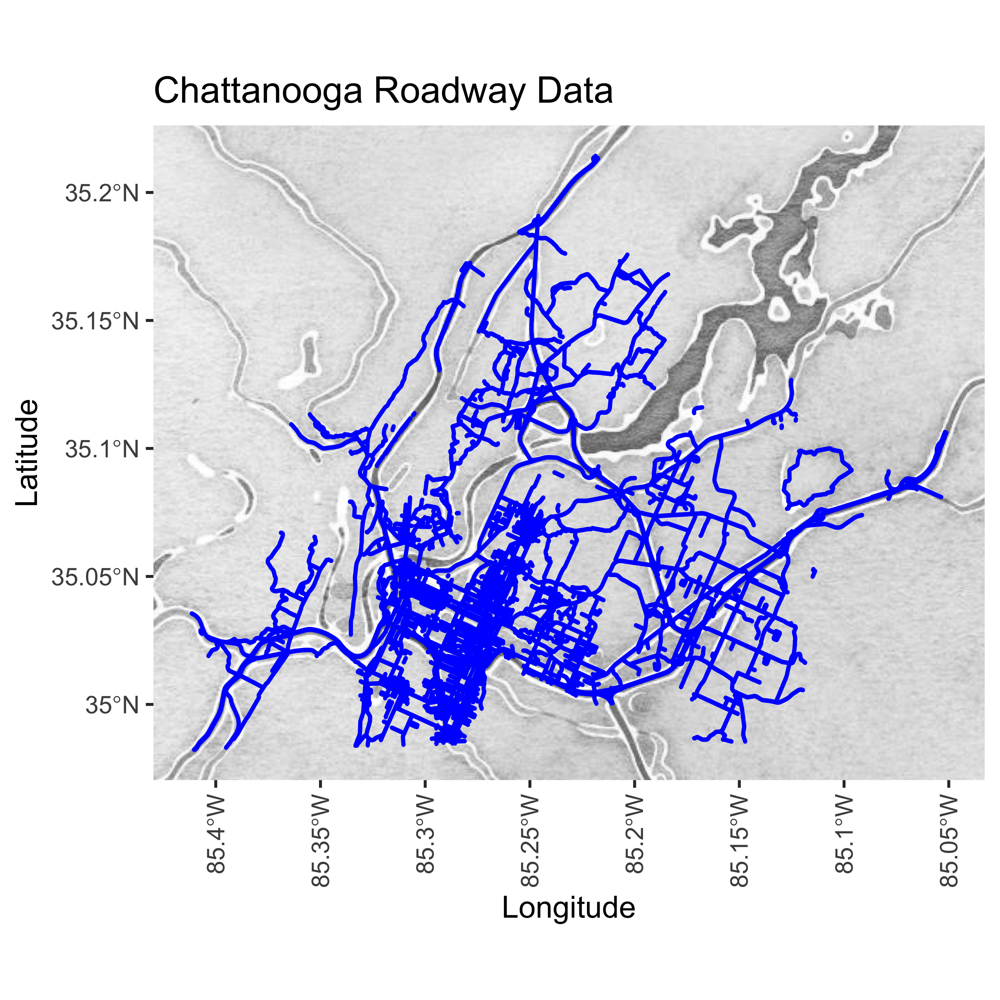 -->

<div>
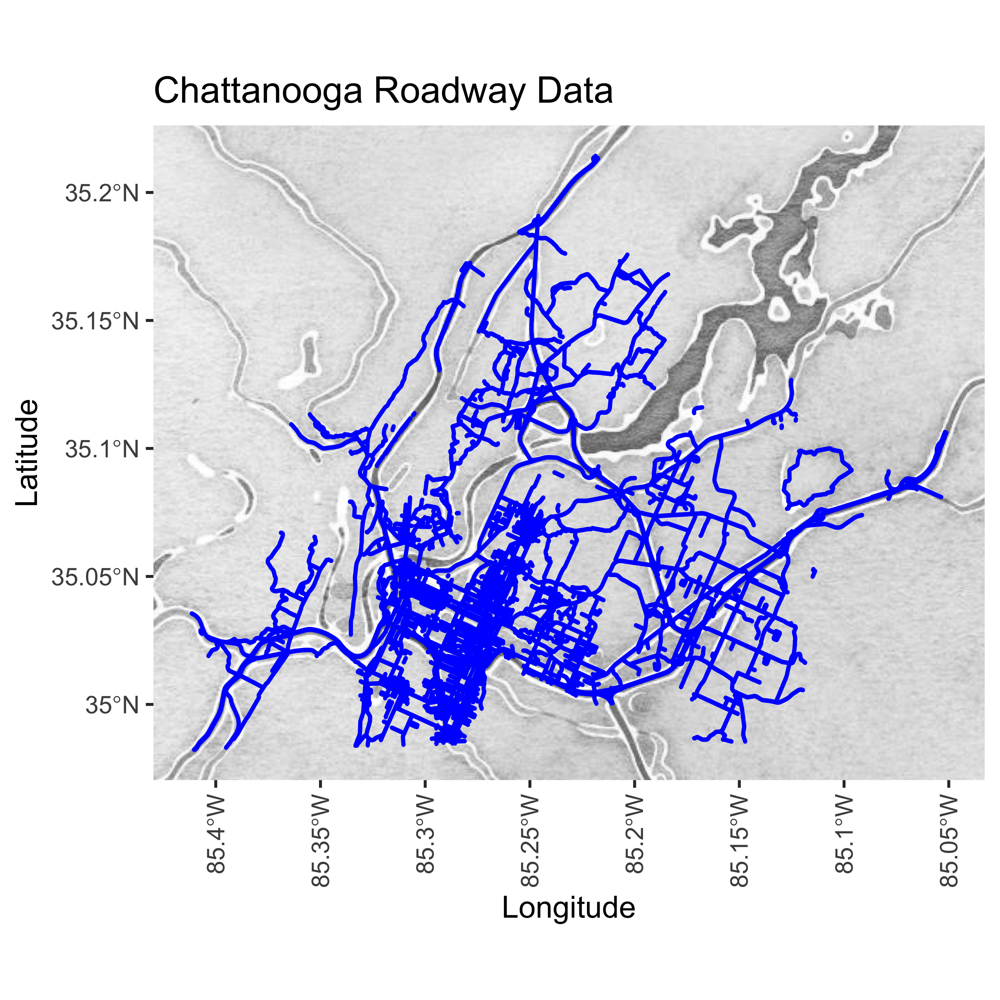
</div>


____
## PreProcessing

### Importing and Exploring Data

The first step to understanding any selection of data is taking a look into what data you actually have. Here, we're importing a dataset that includes rough anonymized data regarding Court Citations. First, let's import the dataset CSV using pandas, and take a look at how many entries we have. 

In [1]:
from platform import python_version

print(python_version())

3.6.9


In [2]:
import tensorflow as tf
print(tf.__version__)



tf.debugging.set_log_device_placement(True)

tf.config.list_physical_devices('GPU')

# "/GPU:0": Short-hand notation for the first GPU of your machine that is visible to TensorFlow.


2.2.0


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
import pandas as pd
citations = pd.read_csv("../Data/City_Court_Citations.csv")
print(len(citations.values))

212812


Next, let's take a look at the types of columns we have. Our data includes temporal and spatial data regarding the citations recorded. 

Now, let's take a look at the first ten records. 

This combination of commands lets us take a closer look into what data we have. Notice that there are multiple 'object' columns, which includes the type and date of the violation, as well as information regarding the individual receiving the citation.

In [4]:
print(citations.dtypes)
citations[0:10]

Citation Year             int64
Citation Number          object
Offense Description      object
Offense Code             object
Race of Offender         object
Sex of Offender          object
Violation Date           object
Address                  object
Longitude               float64
Latitude                float64
Location WKT             object
Citation_Charge_Link      int64
Agency                   object
dtype: object


,Citation Year,Citation Number,Offense Description,Offense Code,Race of Offender,Sex of Offender,Violation Date,Address,Longitude,Latitude,Location WKT,Citation_Charge_Link,Agency
0,2019,Q33097,RUNNING A RED LIGHT: ACCIDENT,O0218A,White,Female,2/17/19 21:30,400 N MARKET ST,-85.308799,35.065202,POINT (-85.308798717696 35.065201611634),1187952,CHATANOOGA PD
1,2019,Q33097,FAILURE TO YIELD RIGHT-OF-WAY: ACCIDENT,55-8-130,White,Female,2/17/19 21:30,400 N MARKET ST,-85.308799,35.065202,POINT (-85.308798717696 35.065201611634),1187953,CHATANOOGA PD
2,2019,Y132034,LIGHT LAW VIOLATION,55-9-402,African American,Male,1/1/19 21:19,1000 N HOLTZCLAW AVE,-85.275350,35.051747,POINT (-85.275350006915 35.05174717652),1220642,CHATANOOGA PD
3,2019,Y029161,SPEEDING,55-8-152,White,Male,1/5/19 21:15,5300 HW153 SB,-85.242198,35.127374,POINT (-85.242198247004 35.127374384516),1221039,CHATANOOGA PD
4,2019,Y029161,FINANCIAL RESPONSIBILITY LAW (INSURANCE LAW),55-12-139,White,Male,1/5/19 21:15,5300 HW153 SB,-85.242198,35.127374,POINT (-85.242198247004 35.127374384516),1221040,CHATANOOGA PD
5,2019,Y050066,FINANCIAL RESPONSIBILITY LAW (INSURANCE LAW),55-12-139,African American,Male,1/4/19 23:59,1000 TUNNEL BLVD,-85.239521,35.040177,POINT (-85.239521412228 35.040177111372),1221041,CHATANOOGA PD
6,2019,Y050066,LIGHT LAW VIOLATION,55-9-402,African American,Male,1/4/19 23:59,1000 TUNNEL BLVD,-85.239521,35.040177,POINT (-85.239521412228 35.040177111372),1221043,CHATANOOGA PD
7,2019,Y066034,SPEEDING,55-8-152,African American,Male,1/6/19 23:14,300 MANUFACTURERS RD,-85.313603,35.062448,POINT (-85.313603119038 35.062448419579),1221114,CHATANOOGA PD
8,2019,Y087627,FINANCIAL RESPONSIBILITY LAW (INSURANCE LAW),55-12-139,African American,Male,1/9/19 17:22,900 N CHAMBERLAIN AVE,-85.260147,35.045116,POINT (-85.260146624969 35.045115634392),1222463,CHATANOOGA PD
9,2019,Y082581,CHILD RESTRAINT LAW VIOLATION,55-9-602,African American,Female,4/11/19 13:40,827 WOODMOORE CIR,-85.226635,35.034660,POINT (-85.226635370051 35.03465955868),1231728,CHATANOOGA PD


Let's cut this data down to just the records where the violation was for speeding, to give us a better answer to our main questions we asked above. We'll also reindex the dataset for ease of understanding. 

In [5]:
citations = citations[citations['Offense Description'] == 'SPEEDING']
citations = citations.reset_index()

Now, we'll be taking a look at our reduced data, now that we've cut it down to just the records that pertain to our question. We can see that there were 20,815 speeding tickets within that larger dataset. 

Again, we'll use the head command to take a look at the first ten records of speeding.  

In [6]:
print(len(citations))
citations.head()

20815


,index,Citation Year,Citation Number,Offense Description,Offense Code,Race of Offender,Sex of Offender,Violation Date,Address,Longitude,Latitude,Location WKT,Citation_Charge_Link,Agency
0,3,2019,Y029161,SPEEDING,55-8-152,White,Male,1/5/19 21:15,5300 HW153 SB,-85.242198,35.127374,POINT (-85.242198247004 35.127374384516),1221039,CHATANOOGA PD
1,7,2019,Y066034,SPEEDING,55-8-152,African American,Male,1/6/19 23:14,300 MANUFACTURERS RD,-85.313603,35.062448,POINT (-85.313603119038 35.062448419579),1221114,CHATANOOGA PD
2,30,2019,Y029169,SPEEDING,55-8-152,White,Male,1/16/19 23:44,5400 HW153,-85.246361,35.136575,POINT (-85.246360986015 35.136574900541),1222242,CHATANOOGA PD
3,37,2019,Y003716,SPEEDING,55-8-152,Asian,Male,1/9/19 10:12,5300 HW153 SB,-85.242198,35.127374,POINT (-85.242198247004 35.127374384516),1221499,CHATANOOGA PD
4,40,2019,Y029167,SPEEDING,55-8-152,NaN,Male,1/16/19 21:53,5400 HW153,-85.246361,35.136575,POINT (-85.246360986015 35.136574900541),1222238,CHATANOOGA PD


We'll need to adjust how our time and date are displayed before splitting the data up, just for simplicity's sake for later usage. Here, we're using a lambda statement to avoid utilizing for loops. For loops are great for assigning variables but they can get slowed down if the dataset becomes too large. While that's not a problem with this smaller dataset, it's good to familarize yourself with time and computation saving code whenever possible.  

In [7]:
import datetime

citations['Violation Date'] = pd.to_datetime(citations['Violation Date'])
citations.dtypes

citations['Time'], citations['Date']= citations['Violation Date'].apply(lambda x:x.time()), citations['Violation Date'].apply(lambda x:x.date())

With the time and date split, let's now get some extra variables to help our model understand those values. Neural network models can't parse string variables, so we'll need to pull out the month, day of the week, and hour in order for the model to understand.

The weekday function finds the day of the week of a given date, and assigns it a value between 0 and 6, where Monday is zero, and Sunday is six. 

Since the dataset already included a year column, we don't have to find that manually. We're using lambdas here as well. 

Finally, we'll take a look at the head of the dataset again to make sure all of our commands worked correctly. 

In [8]:
citations['Month'] = citations['Date'].apply(lambda x: x.month)
citations['WeekDay'] = citations['Date'].apply(lambda x: x.weekday())
citations['Hour'] = citations['Time'].apply(lambda x: x.hour)
citations = citations.rename(columns={"Citation Year": "Year"})
citations.head()

,index,Year,Citation Number,Offense Description,Offense Code,Race of Offender,Sex of Offender,Violation Date,Address,Longitude,Latitude,Location WKT,Citation_Charge_Link,Agency,Time,Date,Month,WeekDay,Hour
0,3,2019,Y029161,SPEEDING,55-8-152,White,Male,2019-01-05 21:15:00,5300 HW153 SB,-85.242198,35.127374,POINT (-85.242198247004 35.127374384516),1221039,CHATANOOGA PD,21:15:00,2019-01-05,1,5,21
1,7,2019,Y066034,SPEEDING,55-8-152,African American,Male,2019-01-06 23:14:00,300 MANUFACTURERS RD,-85.313603,35.062448,POINT (-85.313603119038 35.062448419579),1221114,CHATANOOGA PD,23:14:00,2019-01-06,1,6,23
2,30,2019,Y029169,SPEEDING,55-8-152,White,Male,2019-01-16 23:44:00,5400 HW153,-85.246361,35.136575,POINT (-85.246360986015 35.136574900541),1222242,CHATANOOGA PD,23:44:00,2019-01-16,1,2,23
3,37,2019,Y003716,SPEEDING,55-8-152,Asian,Male,2019-01-09 10:12:00,5300 HW153 SB,-85.242198,35.127374,POINT (-85.242198247004 35.127374384516),1221499,CHATANOOGA PD,10:12:00,2019-01-09,1,2,10
4,40,2019,Y029167,SPEEDING,55-8-152,NaN,Male,2019-01-16 21:53:00,5400 HW153,-85.246361,35.136575,POINT (-85.246360986015 35.136574900541),1222238,CHATANOOGA PD,21:53:00,2019-01-16,1,2,21


<!-- This next section is messy, but there's really no way around it. We need to reduce all of the addresses in the dataset to only the roadways. So, our first step is to remove any leading numbers, which indicate the street address. We're also going to remove indicators for Southbound, Northbound, Eastbound, and Westbound traffic. If these were present with every record, we could use them, but they are far too inconsistent in the data, so we'll be taking them out. Further complicating things is that the word 'Highway' is entered in the data in multiple ways. So, we'll be correcting those as well.  -->

### Combining Roadway Data with Citation reports. 
The next section combines our roadway information with the citation information to give each entry a set roadway name.

First, we'll be creating the geometry column for each of the GPS coordinates in the dataset. 

Then, we'll be setting a coordinate reference system, so that the roadway data and the citation records can be properly matched. 

Finally, we'll take a look at the head of the data again. Notice that the Location WKT column is almost exactly the same as the newly created geometry column. While we could have simply assigned that column as the 'geometry', it is simply a measure of caution to create the geometry column ourselves. 

In [9]:
import geopandas as gpd
from shapely.geometry import Point
from shapely import wkt

citations["geometry"] = citations["Location WKT"].astype(str).apply(wkt.loads)
citations = gpd.GeoDataFrame(citations, geometry="geometry")
citations.crs = "epsg:4326"
citations.head()

,index,Year,Citation Number,Offense Description,Offense Code,Race of Offender,Sex of Offender,Violation Date,Address,Longitude,Latitude,Location WKT,Citation_Charge_Link,Agency,Time,Date,Month,WeekDay,Hour,geometry
0,3,2019,Y029161,SPEEDING,55-8-152,White,Male,2019-01-05 21:15:00,5300 HW153 SB,-85.242198,35.127374,POINT (-85.242198247004 35.127374384516),1221039,CHATANOOGA PD,21:15:00,2019-01-05,1,5,21,POINT (-85.24220 35.12737)
1,7,2019,Y066034,SPEEDING,55-8-152,African American,Male,2019-01-06 23:14:00,300 MANUFACTURERS RD,-85.313603,35.062448,POINT (-85.313603119038 35.062448419579),1221114,CHATANOOGA PD,23:14:00,2019-01-06,1,6,23,POINT (-85.31360 35.06245)
2,30,2019,Y029169,SPEEDING,55-8-152,White,Male,2019-01-16 23:44:00,5400 HW153,-85.246361,35.136575,POINT (-85.246360986015 35.136574900541),1222242,CHATANOOGA PD,23:44:00,2019-01-16,1,2,23,POINT (-85.24636 35.13657)
3,37,2019,Y003716,SPEEDING,55-8-152,Asian,Male,2019-01-09 10:12:00,5300 HW153 SB,-85.242198,35.127374,POINT (-85.242198247004 35.127374384516),1221499,CHATANOOGA PD,10:12:00,2019-01-09,1,2,10,POINT (-85.24220 35.12737)
4,40,2019,Y029167,SPEEDING,55-8-152,NaN,Male,2019-01-16 21:53:00,5400 HW153,-85.246361,35.136575,POINT (-85.246360986015 35.136574900541),1222238,CHATANOOGA PD,21:53:00,2019-01-16,1,2,21,POINT (-85.24636 35.13657)


Now, we'll be importing our roadway data, double-checking the type of our roadways, and limiting the entries to only that type. Note that sometimes datasets will have corrupted or incomplete data. This was the case with this dataset, where one entry of the roadways was incomplete. We can see that in the totals printed before and after the selection line. 

Next, we join the two datasets together with a geopandas command called sjoin. Sjoin determines spatial matching between datasets of any type (Point, Polygon, Multi-line, etc) and one can select how they would like the new merged set to be set up by selecting 'left', 'right', or 'inner' for the how variable. We are looking to select citations within the roadway data, so we will select 'left', since our citations set is the left variable. 

Something interesting happens when we merge our data, though. notice that the number of records actually increases. This is related to the records that do not fall within a given roadway polygon. The true number of citations retained is shown in our last print line, where we can see the number falling to 18,576. 

Once again, we'll print the head of the data to verify our changes. 

In [10]:
roads = gpd.read_file("../Data/Roads/Roads.shp")
print(roads.geometry.type)

print("Roads:", len(roads.values))
roads = roads[roads.geometry.type == 'Polygon']
print("Roads:",len(roads.values))

print("Citation records before merge:",len(citations.values))
citations = gpd.sjoin(citations, roads, how="left", op="within")
print("Records after merge", len(citations.values))

print("Citations before dropping duplicates:",len(citations.values))
citations = citations.dropna(subset=['Road'])
citations = citations.drop_duplicates(subset ='index')
print("Citations after dropping duplicates:",len(citations.values))
citations.head()


0        Polygon
1        Polygon
2        Polygon
3        Polygon
4        Polygon
          ...   
11504    Polygon
11505    Polygon
11506    Polygon
11507    Polygon
11508    Polygon
Length: 11509, dtype: object
Roads: 11509
Roads: 11473
Citation records before merge: 20815
Records after merge 54517
Citations before dropping duplicates: 54517
Citations after dropping duplicates: 18576


,index,Year,Citation Number,Offense Description,Offense Code,Race of Offender,Sex of Offender,Violation Date,Address,Longitude,...,Agency,Time,Date,Month,WeekDay,Hour,geometry,index_right,Road,Segment
0,3,2019,Y029161,SPEEDING,55-8-152,White,Male,2019-01-05 21:15:00,5300 HW153 SB,-85.242198,...,CHATANOOGA PD,21:15:00,2019-01-05,1,5,21,POINT (-85.24220 35.12737),5065.0,Highway 153,1.0
1,7,2019,Y066034,SPEEDING,55-8-152,African American,Male,2019-01-06 23:14:00,300 MANUFACTURERS RD,-85.313603,...,CHATANOOGA PD,23:14:00,2019-01-06,1,6,23,POINT (-85.31360 35.06245),6530.0,Manufacturers Rd,5.0
3,37,2019,Y003716,SPEEDING,55-8-152,Asian,Male,2019-01-09 10:12:00,5300 HW153 SB,-85.242198,...,CHATANOOGA PD,10:12:00,2019-01-09,1,2,10,POINT (-85.24220 35.12737),5065.0,Highway 153,1.0
5,50,2019,Y090161,SPEEDING,55-8-152,White,Female,2019-01-01 23:10:00,200 GEORGIA AVE,-85.302488,...,CHATANOOGA PD,23:10:00,2019-01-01,1,1,23,POINT (-85.30249 35.05758),4413.0,Georgia Ave,16.0
6,60,2019,Y139892,SPEEDING,55-8-152,White,Female,2019-01-22 16:21:00,1600 MCCALLIE AVE,-85.278663,...,CHATANOOGA PD,16:21:00,2019-01-22,1,1,16,POINT (-85.27866 35.03709),6709.0,McCallie Ave,15.0


Now, let's take the set of roadway strings we just created and convert them into category variables. This takes all the roadways in question and creates a unique numeric tag for each one. This way our roadways can be input into the model, while retaining their unique identities. 

In [11]:
citations['Road_Num'] = citations['Road'].astype("category").cat.codes
citations['Road_Num']

0        397
1        455
3        397
5        360
6        461
        ... 
20809     84
20810    222
20811    222
20812    295
20813    222
Name: Road_Num, Length: 18576, dtype: int16

### Parring Down Variables and Preparing for Negative Sampling
Now we can identify which columns need to be removed for our model. Anything that is a string or factor cannot be parsed, so it has to go. Also, there are columns that aren't really necessary for the situation, like information about the person who received the ticket. This list of variables to drop includes: 
- Citation Number
- Offense Description
- Offense Code
- Race of Offender
- Sex of Offender
- Violation Date
- Address 
- Location WKT
- Citation_Charge_Link
- Agency 
- Date
- Index from roadways

Now, before we remove any of these variables, we'll be making a copy to retain all of our information. Also, we'll be making a smaller dataframe with just our roadways and numeric tags, so we can understand the output of our model. 

In [12]:
processedData = citations.copy()
ids = (citations[["Road", "Road_Num"]].drop_duplicates()).sort_values(by=['Road_Num'])
ids[0:10]
ids.to_csv("../Data/RoadsIDs.csv")

In [13]:
citations.columns
citations = citations.reset_index()
citations = citations[['Year','Month','WeekDay','Hour','Segment','Road_Num']]
citations.head()
citations.to_csv("../Data/ProcessedData.csv", index=False)

### Negative Sampling
Negative sampling is the creation of negative records from the provided positive records, through the alteration of some if not all of the available variables. Then, the negative samples are compared to the original positive records to remove any possible false negatives. 
We can roughly determine how many combinations of the remaining variables are possible, minus the records we
have within the dataset. As shown below, there is an immense amount of negatives possible when considering all combinations of the variables available. However, not all of these options are available, as each roadway has a differing number of segments.

In [14]:
unique_possible = (len(pd.unique(citations.Road_Num.values)) * len(pd.unique(citations.Segment.values)) * len(pd.unique(citations.WeekDay.values)) * 
len(pd.unique(citations.Year.values)) * len(pd.unique(citations.Hour.values)) * 
len(pd.unique(citations.Month.values))) - len(citations.values)

print(unique_possible)

642279024


Since the creation of negative records is not the focus of this post, we'll just highlight a quick example using a very small slice of our overall dataset. We're slicing a copy of the first ten entries in the citations dataset, and expanding on a Itertools method called product in order to mimic the behavior of an R method called expand. Basically, expand takes a dataset and 'expands' the current entries into every possible combination of said entries. Notice that the unique entries in the created negative set test all match to those found in that sliced piece from citations, but the combinations of those variables created almost a million entries, once the existing citations entries were removed. 

In [15]:
import itertools

def expandgrid(*items):
   product = list(itertools.product(*items))
   return {'Var{}'.format(i+1):[x[i] for x in product] for i in range(len(items))}

sliced = pd.DataFrame(citations.values[0:10], columns = citations.columns)
sliced.columns
print(sliced)


foo = pd.DataFrame(expandgrid(sliced.WeekDay, sliced.Month, sliced.Year, 
                               sliced.Road_Num, sliced.Segment, sliced.Hour))
print(len(foo))

foo.head()
foo.columns = ['WeekDay','Month','Year','Road_Num','Segment','Hour']
foo = foo[sliced.columns.values]
foo = foo[~foo.isin(citations)].dropna()
print(len(foo))

for i in foo.columns: 
    print(i, " : ", foo[i].unique())
foo.head()

     Year  Month  WeekDay  Hour  Segment  Road_Num
0  2019.0    1.0      5.0  21.0      1.0     397.0
1  2019.0    1.0      6.0  23.0      5.0     455.0
2  2019.0    1.0      2.0  10.0      1.0     397.0
3  2019.0    1.0      1.0  23.0     16.0     360.0
4  2019.0    1.0      1.0  16.0     15.0     461.0
5  2019.0    4.0      2.0  14.0      9.0     549.0
6  2019.0    1.0      3.0  19.0      5.0     426.0
7  2019.0    1.0      1.0  11.0      1.0     398.0
8  2019.0    1.0      2.0  16.0      2.0     164.0
9  2019.0    1.0      3.0  10.0     23.0     592.0
1000000
992686
Year  :  [2019.]
Month  :  [1. 4.]
WeekDay  :  [5. 6. 2. 1. 3.]
Hour  :  [21. 19. 14. 23. 11. 10. 16.]
Segment  :  [ 5.  2. 16. 15.  1. 23.  9.]
Road_Num  :  [455. 360. 426. 398. 164. 592. 397. 461. 549.]


,Year,Month,WeekDay,Hour,Segment,Road_Num
1160,2019.0,1.0,5.0,21.0,5.0,455.0
1366,2019.0,1.0,5.0,19.0,5.0,360.0
1685,2019.0,1.0,5.0,14.0,2.0,426.0
1733,2019.0,1.0,5.0,23.0,16.0,398.0
1737,2019.0,1.0,5.0,11.0,16.0,398.0


Now we can import our actual negative data (created outside of this example, for simplicity's sake). 

In order to produce a rough ratio for negatives to positives, we'll find how many times the number of citations fits within the negatives, and then take a given iterative of that number. In this case, The length of the negatives is roughly 142 times the length of the citations, so we'll be saving every 142nd entry in the negatives in order to create a roughly 1:1 ratio. 

The imported negatives have the 'Citation' variable set to zero, since no speeding citation was issued for that temporal/spatial instance. So, we have to add a 'Citation' variable to the actual citation data, and then we are able to merge the sets. All in total, the dataset, once merged, has a length of 37,272 entries with a roughly 1:1 ratio for citations to negatives. 

In [16]:
import feather
negatives = feather.read_dataframe("../Data/Negatives/Negatives.feather")
print(len(negatives))
cut = int(len(negatives) / len(citations))
print(cut)

negatives = negatives.iloc[::cut, :]
print(len(negatives))
citations['Citation'] = 1
print(len(citations))
data = pd.concat([negatives, citations])
data = data.sort_values(by = ['Year', 'Month'])

print(len(data))

2654771
142
18696
18576
37272


___
## Neural Network Creation 

### Splitting Data and preparing for the neural network

With our data now in a format that our model can understand, let's create the training and testing sets. First, after all of our imports are done, we shuffle the data. This allows the model to properly understand the data, and allows for the best chance of each epoch receiving a different 'chunk' of the data. Next, we'll be dividing the sets by year, with this year's (2020) citations being our testing set. Finally, let's also take a look at how many records are in each. We can see that there are 36,029 entries in our training, and 1,243 in our testing. 

In [17]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from keras import callbacks
from sklearn.metrics import accuracy_score, auc, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing

# Import matplotlib pyplot safely
try:
    import matplotlib.pyplot as plt
except ImportError:
    import matplotlib
    matplotlib.use("TkAgg")
    import matplotlib.pyplot as plt

data = shuffle(data)
training = data[data['Year'] < 2020]
testing = data[data['Year'] == 2020]

print(len(training.values))
print(len(testing.values))

Using TensorFlow backend.


36029
1243


### Standardizing Data with MinMaxScaler
The function below takes in a dataset, removing the 'Y' column and transforming the data using a minimum/maximum scaler. What this means is that for each column in the data, the maximum and minimum values are found, and are reassigned as 1 and 0 respectively. Then, each value in the column is scaled to fall between those two limits. This simplifies the process for the neural network, allowing for faster learning.

In [18]:
def standardize(data, Y):
    columns = data.columns.values[~data.columns.isin([Y])]
    Y = data[[Y]]
    print(columns)
    scaler = preprocessing.MinMaxScaler()
    # Fit your data on the scaler object
    dataScaled = scaler.fit_transform(data[columns])
    dataScaled = pd.DataFrame(dataScaled, columns=columns)
    return dataScaled, Y

The following code snippet takes the training and testing sets we just created, and standardizes them, splitting into X and Y for both training and testing. Then, we take a look at the resulting datasets. 

Note that in this particular dataset, we don't apply the scaler to the Y column, since it is already on a minmax scale. 

In [19]:
X_Train, Y_Train = standardize(training, 'Citation')
X_Test, Y_Test = standardize(testing, 'Citation')

print(Y_Train.head())
print(X_Train.head())

print(Y_Test.head())
print(X_Test.head())

['Year' 'Month' 'WeekDay' 'Hour' 'Segment' 'Road_Num']
['Year' 'Month' 'WeekDay' 'Hour' 'Segment' 'Road_Num']
         Citation
3698          1.0
364940        0.0
1758244       0.0
2122332       0.0
976           1.0
       Year     Month   WeekDay      Hour  Segment  Road_Num
0  0.285714  0.272727  0.000000  0.478261   0.1375  0.771791
1  0.285714  0.272727  0.333333  0.956522   0.0875  0.144216
2  0.142857  0.909091  0.500000  0.695652   0.0250  0.660856
3  0.142857  0.636364  0.500000  0.521739   0.0125  0.806656
4  1.000000  0.272727  0.000000  0.608696   0.0000  0.442155
         Citation
1606872       0.0
2478326       0.0
1326990       0.0
598246        0.0
627072        0.0
   Year  Month   WeekDay      Hour   Segment  Road_Num
0   0.0   0.00  0.000000  0.869565  0.000000  0.606349
1   0.0   0.25  0.500000  0.478261  0.000000  0.934921
2   0.0   0.25  1.000000  0.739130  0.138889  0.501587
3   0.0   0.25  0.833333  0.739130  0.000000  0.236508
4   0.0   0.00  0.500000  0.08695

### Creating a Neural Network Model

Now, we can actually create our neural network. For this example, we'll be utilizing a Sequential model, with an input layer, and output layer, and three layers in between, gradually diminishing the node counts. We compile the model with a variety of optimizers and loss functions, to test which of the list is the best combination. 

In [20]:
def evaluating_model(X_Train, Y_Train, model, Y_Test, hist):
    
    # This is evaluating the model, and printing the results of the epochs.
    scores = model.evaluate(X_Train, Y_Train, batch_size=10)
    print(scores)
    print("\nModel Training Accuracy:", scores[2] * 100)

    print("Model Training Loss:", sum(hist.history['loss']) / len(hist.history['loss']))

    # Okay, now let's calculate predictions probability.
    predictions = model.predict(X_Test)  

    # Then, let's round to either 0 or 1, since we have only two options.
    predictions_round = [abs(round(x[0])) for x in predictions]

    # Finding accuracy score of the predictions versus the actual Y.
    accscore1 = accuracy_score(Y_Test, predictions_round)
    
    # Printing it as a whole number instead of a percent of 1. (Just easier to read)
    print("Rounded Test Accuracy:", accscore1 * 100)
    
    # Find the Testing loss as well:
    print("Test Loss", sum(hist.history['val_loss']) / len(hist.history['val_loss']))

    ##Finding the AUC for the cycle: 
    fpr, tpr, _ = roc_curve(Y_Test, predictions_round)
    roc_auc = auc(fpr, tpr)
    print('AUC: %f' % roc_auc)

    tn, fp, fn, tp = confusion_matrix(Y_Test, predictions_round).ravel()
    print(tn, fp, fn, tp)
    return tn, fp, fn, tp, roc_auc, fpr, tpr

#def main():
# Setting our metric options
opts = ['rmsprop','adam','nadam']
losses = ["binary_crossentropy", "poisson", "mse"]
mets = ['Recall', 'accuracy', 'AUC']

results = pd.DataFrame(columns = ['loss', 'recall', 'accuracy', 'auc', 'val_loss', 'val_recall', 
                                  'val_accuracy', 'val_auc', 'Optimizer','Loss'])
# Cycling through the optimizers, then loss functions to find the best fitting combinations. 
for o in opts: 
    for l in losses: 
        print("Metrics:", o,l)

        # 4. Creation of model structure. 
        model = tf.keras.Sequential()
        # Input layer
        model.add(Dense(len(X_Train.columns), input_dim=len(X_Train.columns), activation='sigmoid'))

        # Hidden Layers
        model.add(Dense(int(len(X_Train.columns)/2), activation='sigmoid'))
        model.add(Dense(int(len(X_Train.columns)/3), activation='sigmoid'))
        model.add(Dense(int(len(X_Train.columns)/4), activation='sigmoid'))

        # Output layer
        model.add(Dense(1, activation='sigmoid'))

        # Compiling each unique model.
        model.compile(loss=l, optimizer=o, metrics=mets)

        # Providing a subset of the testing set to validate training. 
        X_valid = X_Test[0:100]
        Y_valid = Y_Test[0:100]

        # Fitting the unique models, and creating the model history. 
        hist = model.fit(X_Train, Y_Train, epochs=10, batch_size=25, validation_data=(X_valid, Y_valid), verbose=1)

        # Creation of the 'test' dataframe allows for easy saving of each combo of optimizer and loss functions. 
        test = pd.DataFrame.from_dict(hist.history, orient='columns')
        test['Optimizer'] = o
        test['Loss'] = l

        tn, fp, fn, tp, roc_auc, fpr, tpr = evaluating_model(X_Train, Y_Train, model, Y_Test, hist)
        model.save_weights("../Models/"+o+"_"+l+".h5")
        print("Saved grid model to disk")
        tf.keras.backend.clear_session()

        # Saving results from evaluating_model function, and concating the unique model performance to the whole. 
        test['TN'] = tn
        test['FP'] = fp
        test['TP'] = tp
        test['FN'] = fn
        test['test_recall'] = tp / (tp+fn)
        test['test_accuracy'] = (tp + tn) / (tp+fn+tn+fp)
        test['FPR'] = str(fpr)
        test['TPR'] = str(tpr)
        test['ROC_AUC'] = roc_auc
        results = result = pd.concat([results, test])
# Saving the completed results of all model combinations.         
results.to_csv("../Data/TrainingResults.csv", index=False)
    
#if __name__ == "__main__":
#    main()

Metrics: rmsprop binary_crossentropy
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp i

____
## Results Analysis
Now that the models have completed running, we can analyze their results graphically. Each of the metric combinations is represented by a different color and line type combo, with the colors and linetypes remaining consistent through the following visualization. 

### Results - Accuracy Performance

Here, we can discern that the Nadam optimizer sets begin much lower in accuracy, but catch up to their fellows within one epoch run. The first metric set to begin increase toward the final score is the Adam/MSE pair, with the accuracy reaching 71.89 on the fifth epoch. By the sixth epoch, this metric set had reached its point of convergence. However, this set (72.36) was marginally overtaken by both Nadam/MSE (72.364) and Nadam/Binary Crossentropy (72.397) by the tenth epoch. 

<!-- 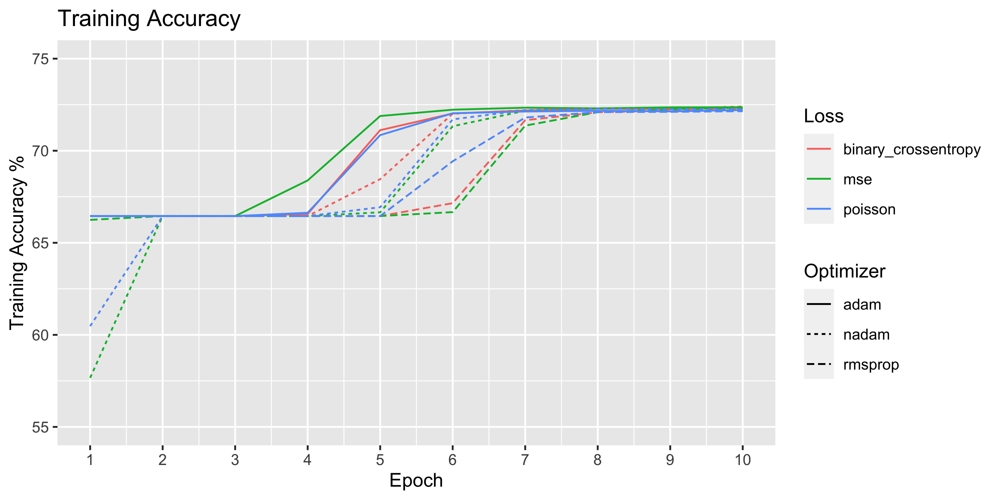 -->

<div>
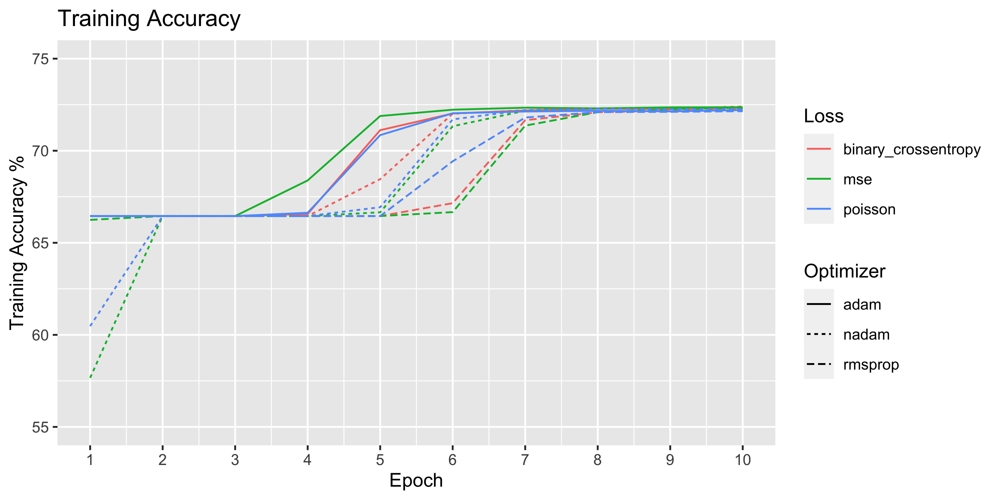
</div>

Validation Accuracy proved to be a more chaotic affair, with all sets roughly beginning at 76 percent accuracy. The maximum validation accuracy was provided by the combination of RMSProp and Poisson, finishing at 77 percent where the second position fell to Adam/Poisson. 

<!-- 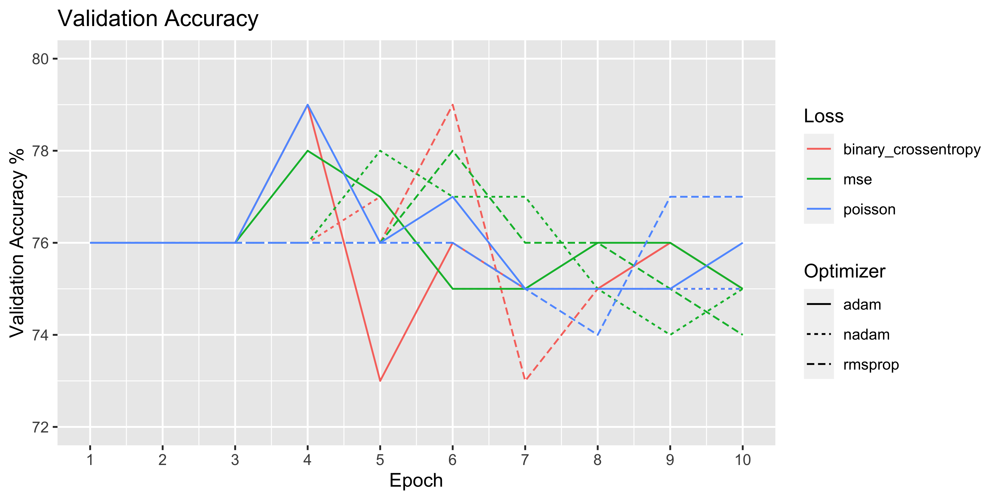 -->

<div>
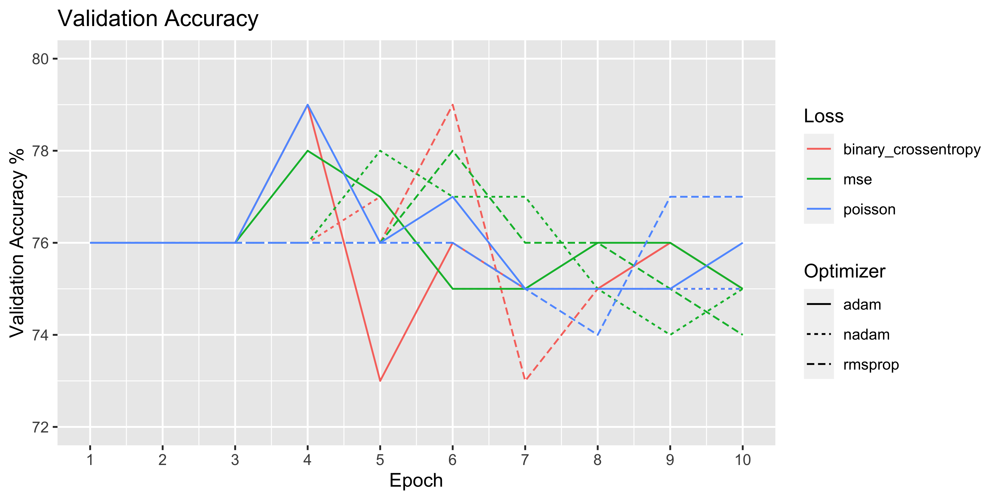
</div>


Once testing of each combination was completed, the RMSProp/Poisson set was found to rank highest in Testing Accuracy, with a score of 78.44 percent. The next was Adam/Poisson, with 78.042. 

<!-- 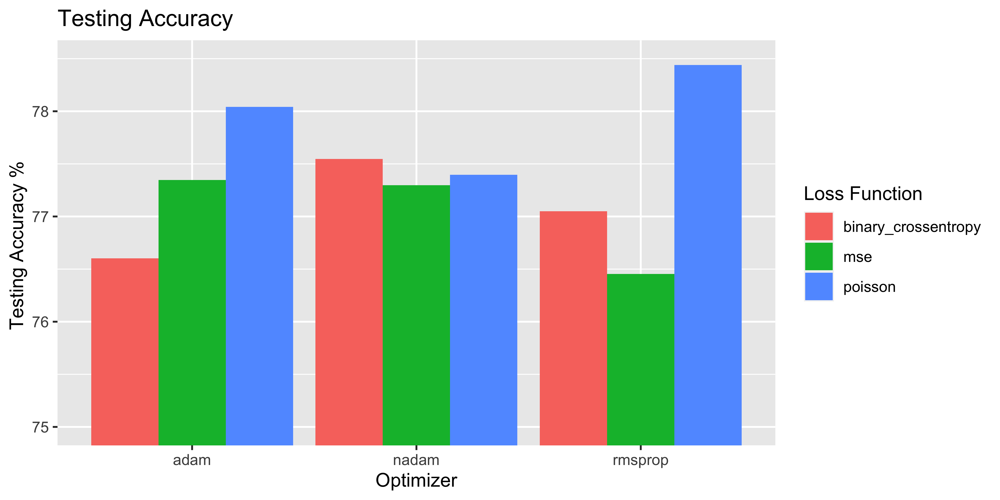 -->

<div>
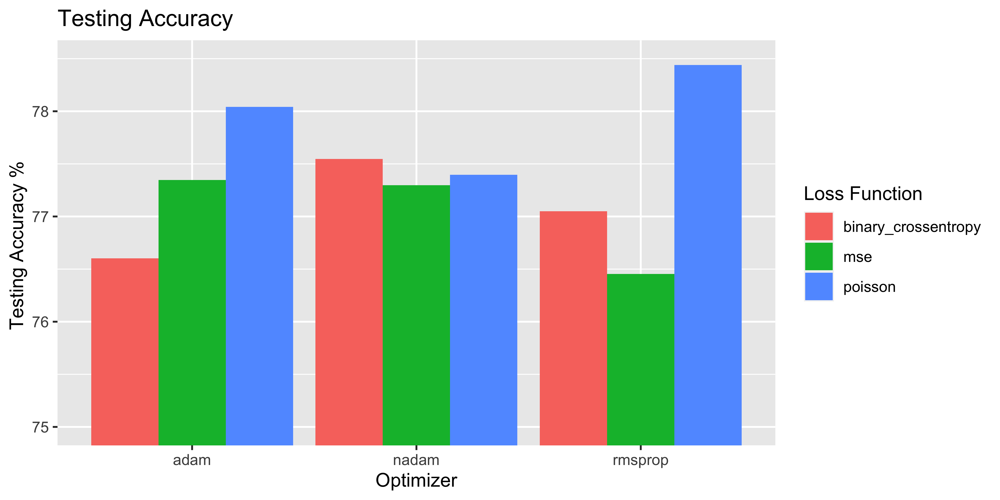
</div>

### Results - Recall Performance

Recall is the measure of how many records were correctly predicted positive, or the value found by 

$\frac{True Positive}{(True Positive + False Negative)}$

Recall of many of the metric sets begins at zero, with all predictions 'No Citation'. However, Nadam/MSE, RMSProp/MSE, and Nadam/Poisson all begin at higher values before falling to zero. While many of the sets began predicting citations on Epoch 4, their performance was most certainly topped by the Adam/MSE set. Note that this set continued to outperform the rest until Epoch 7, where many sets caught up in performance. Epoch 7 is also when the Nadam/Binary Crossentropy set began outperforming, with a Recall of 40.87 percent. This set finished training at 41.67 percent Recall. 

<!-- 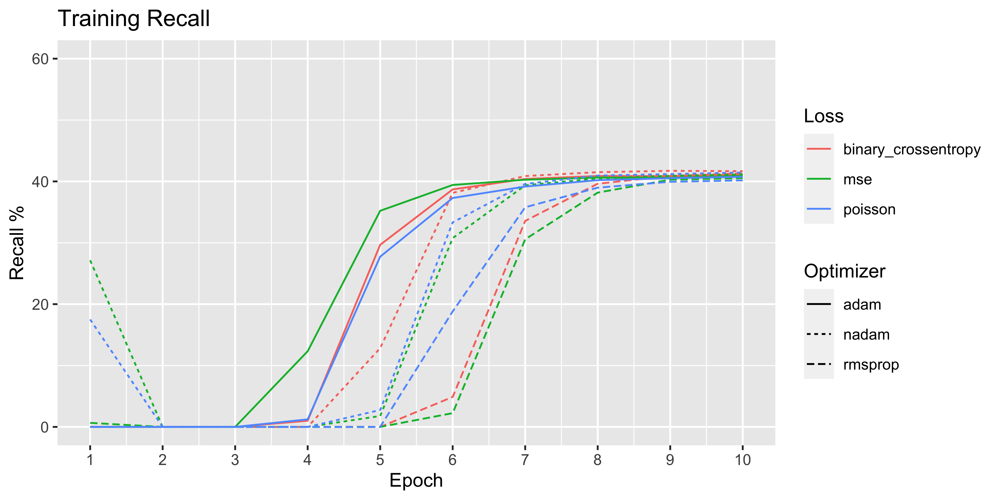 -->

<div>
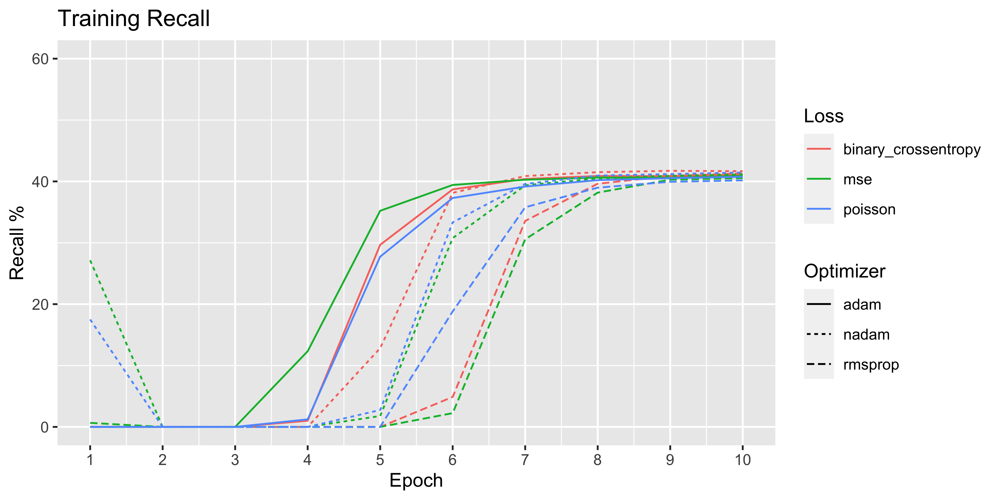
</div>

Most of the sets performed similarly on validation, with only variety in when higher Recall values were achieved. again, Nadam/MSE was the first to approach max Recall, upon Epoch 4, and RMSProp/MSE was the last with Epochs 6/7. All sets finished validation at 58.33 percent Recall. 

<!-- 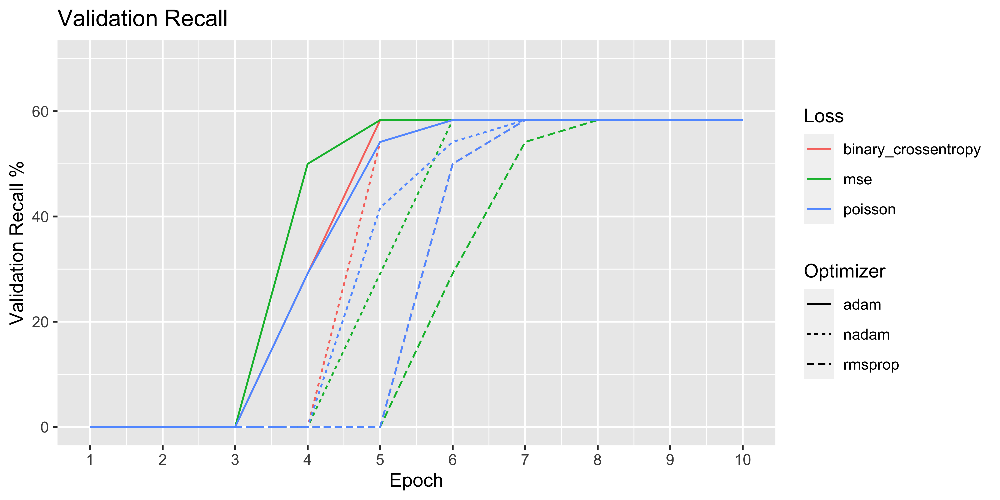 -->

<div>
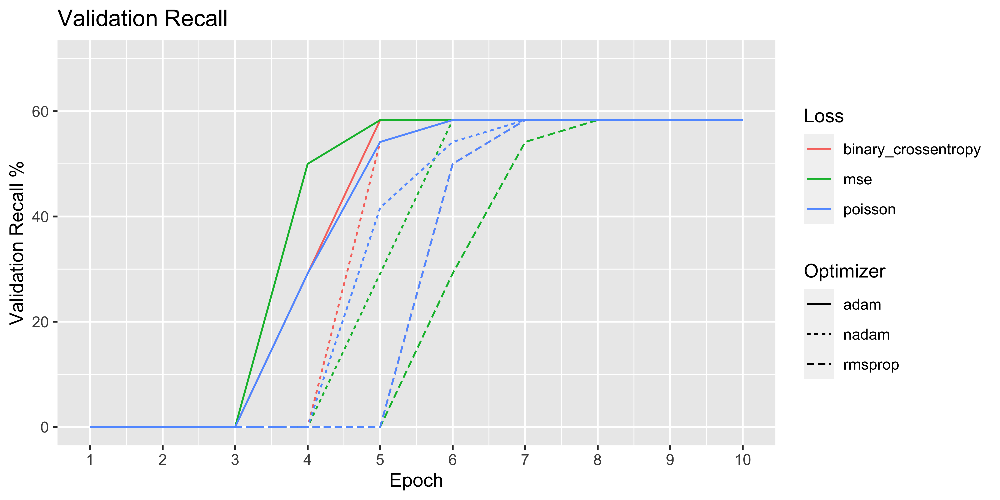
</div>

Recall upon testing of the various sets presented the Adam/Binary Crossentropy, RMSProp/Binary crossentropy, and RMSProp/MSE sets all performing well, all with Recalls of 64.84. The least performing was RMSProp/Poisson, at 62.94. 


<!-- 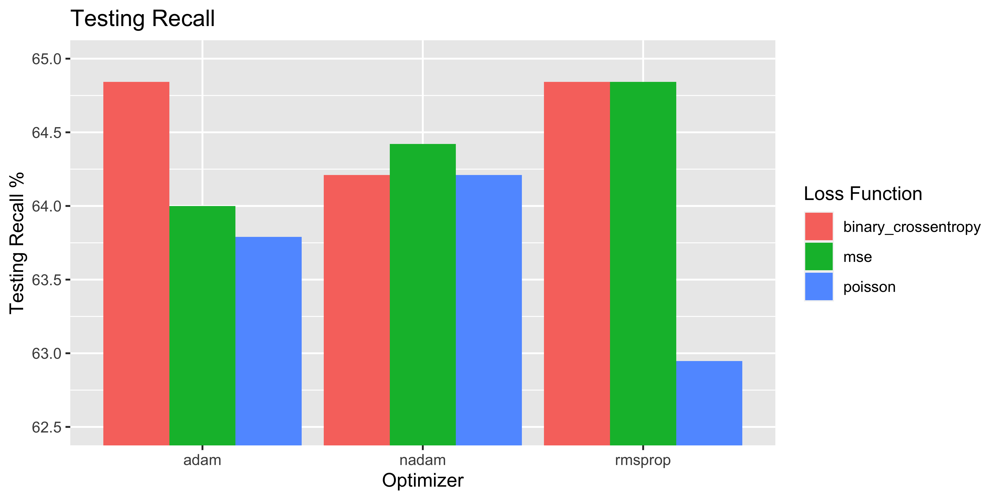 -->

<div>
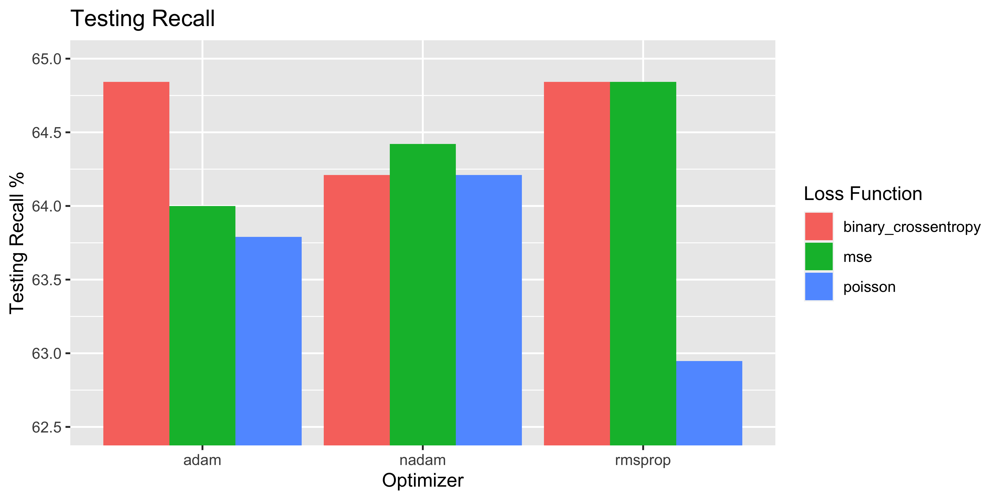
</div>

### Creating a prediction set

Now, we'll be importing a dataset of all citations from the month of April in 2020, and will be suppling them to the model for predictions. Of the 12 citations issued, 8 were correctly identified by the model. The Recall in this case would be roughly 66.7%, somewhat higher than the previously testing recall. Also of note is that even records not correctly identified were above 42.41% probability to see a citation. 

In [22]:
data = pd.read_csv("../Data/AprilCite.csv")
data = shuffle(data)
cutdata, Y = standardize(data,'Citation')

# Load in model weights from training session. 
#model = tf.keras.Sequential()

#### 
model = tf.keras.Sequential()
# Input layer
model.add(Dense(len(X_Train.columns), input_dim=len(X_Train.columns), activation='sigmoid'))

# Hidden Layers
model.add(Dense(int(len(X_Train.columns)/2), activation='sigmoid'))
model.add(Dense(int(len(X_Train.columns)/3), activation='sigmoid'))
model.add(Dense(int(len(X_Train.columns)/4), activation='sigmoid'))

# Output layer
model.add(Dense(1, activation='sigmoid'))

# Compiling each unique model.
model.compile(loss=l, optimizer=o, metrics=mets)

#### 

model.load_weights("../Models/rmsprop_mse.h5")
probability = model.predict(cutdata)

# Save the predicted values to the Probability column.
data["Probability"] = probability

# Then, let's round to either 0 or 1, since we have only two options (accident or no).
predictions_round = [abs(round(x[0])) for x in probability]
data["Prediction"] = predictions_round

# Printing some of the found values, as well as the total number of predicted accidents for this data.
print("\tMin probability of citation: ", round(float(min(probability) * 100), 2))
print("\tMax probability of citation: ", round(float(max(probability) * 100), 2))
print("\tCorrectly predicted: ", sum(data.Prediction == data.Citation))

data.to_csv("../Data/AprilPredicted.csv")

['Year' 'Month' 'WeekDay' 'Hour' 'Segment' 'Road_Num']
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_681378 in device /job:localhost/replica:0/task:0/device:GPU:0
	Min probability of c

However, testing the performance of a model upon only positive data can skew result reporting. Therefore, we must test the model with a given fixed temporal set. In this case, negative samples were specifically selected for Thursdays in April 2020, at 4PM. This means four of the column values within the negatives are set, with only roadway data fluctuating. Then, the citations for that specific timeframe are added and same process is followed as above, passing the data into the predict function and finding the probability of an accident at each of the roadway segments. 

Given that the issuing of citations depends strongly on many other factors not being considered in this brief example, it is understandable that the model created only accurately identified 28 records. Of course, this is considering a loose defined fifty/fifty probability. In many real-world use cases, a fifty/fifty probability would not necessarily be considered in favor of 'higher certainty' scores like 75 or even 90 % probability. 

In [23]:
data = pd.read_csv("../Data/AprilTest.csv")
print("Number of records:", len(data))
data = shuffle(data)
cutdata, Y = standardize(data,'Citation')

#### 
model = tf.keras.Sequential()
# Input layer
model.add(Dense(len(X_Train.columns), input_dim=len(X_Train.columns), activation='sigmoid'))

# Hidden Layers
model.add(Dense(int(len(X_Train.columns)/2), activation='sigmoid'))
model.add(Dense(int(len(X_Train.columns)/3), activation='sigmoid'))
model.add(Dense(int(len(X_Train.columns)/4), activation='sigmoid'))

# Output layer
model.add(Dense(1, activation='sigmoid'))

# Compiling each unique model.
model.compile(loss=l, optimizer=o, metrics=mets)

#### 

# Load in model weights from training session. 
model.load_weights("../Models/rmsprop_mse.h5")
probability = model.predict(cutdata)

# Save the predicted values to the Probability column.
data["Probability"] = probability

# Then, let's round to either 0 or 1, since we have only two options (accident or no).
predictions_round = [abs(round(x[0])) for x in probability]
data["Prediction"] = predictions_round

# Printing some of the found values, as well as the total number of predicted accidents for this data.
print("\tMin probability of citation: ", round(float(min(probability) * 100), 2))
print("\tMax probability of citation: ", round(float(max(probability) * 100), 2))
print("\tCorrectly predicted: ", sum(data.Prediction == data.Citation))
print("\tCitations predicted: ", sum(data.Prediction))
print("\tCitations existed: ", sum(data.Citation))

data.to_csv("../Data/AprilPredictedBoth.csv")

Number of records: 4943
['Segment' 'Road_Num' 'Month' 'WeekDay' 'Year' 'Hour']
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_681630 in device /job:localhost/replica:0/task:0/device:GPU

### Analyzing Results Spatially 

Finally, we can take a look at the specific areas that the model was most certain a citation would occur. The below graphic presents the fifty roadway segments that the model was most certain that a citation would occur. Note that the window of probability presented here is quite small. 

Also of interest is the number of shorter length segments that earned the highest probability. Only two segments of a considerable length were included in the top fifty, with a handful of other segments having longer than a few blocks length. 

Finally, of the entire Chattanooga area the fifty segments with the highest probability of a citation occuring are all located in a small area of the city. Particuarly, the area between 85.325&deg;W and 85.3&deg;W. 

<!-- 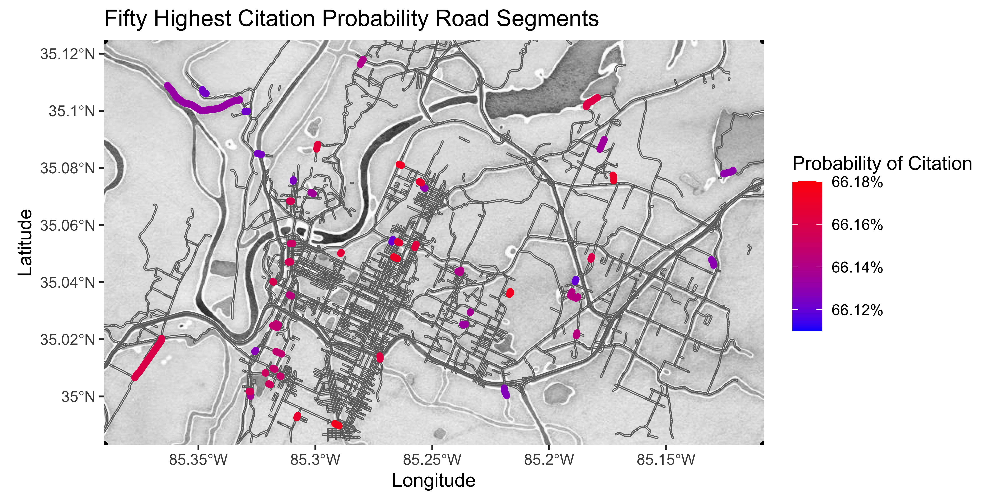 -->


<div>
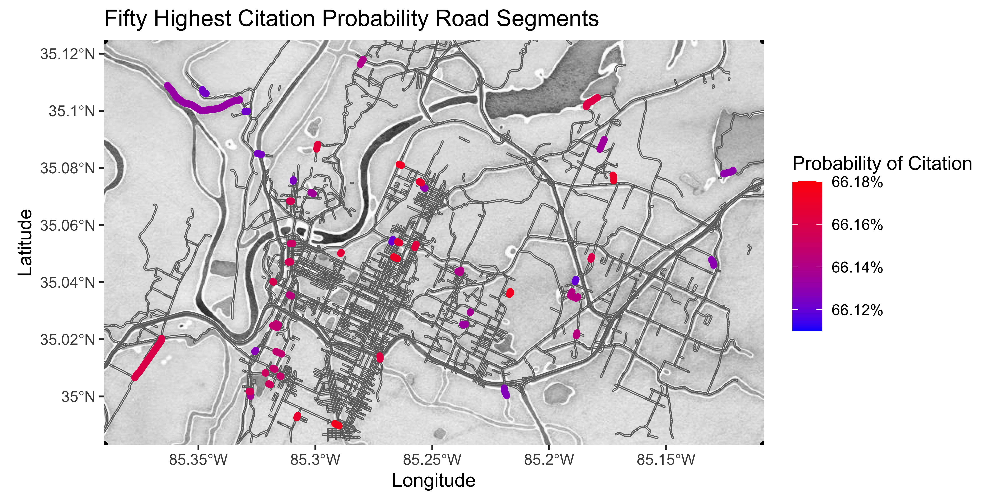
</div>

____
## Summary

In this example, we've walked through the preprocessing of data, creation of spatial and temporal variables based off of existing variables, and concluded with the creation of multiple Multilayer Perceptron models, made to predict which sections of local roadways would be likely to see speeding citations in 2020 with a variety of metrics. We've also discussed the results of those models, examining which performed best in both Accuracy and Recall, and put the model to the test with a smaller dataset representing April 2020. 

We hope you've enjoyed this tutorial. Please join us for more machine learning walkthroughs in the future. 

If you'd like further help in topics such as:

- General machine learning education
- Advanced deep learning modeling
- Enterprise machine learning infrastructure

Please [reach out to us and say hello](http://www.pattersonconsultingtn.com/contact.html)